In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
import pickle
import seaborn as sns
import os
import glob
from sklearn.metrics import confusion_matrix, recall_score, roc_auc_score, roc_curve, accuracy_score, precision_score, f1_score

In [2]:
df = pd.DataFrame()

data = []

for d in os.scandir('AReM'):
    if d.is_dir():
        result = d.name
        for file in glob.glob('AReM/' + d.name + '/*.csv'):
            temp_df = pd.read_csv(file, skiprows = 4, usecols=[0,1,2,3,4,5,6])                 #skiprows to skip first 4 rows with metadata and use cols to prevent the error "ParserError: Error tokenizing data. C error: Expected 7 fields in line 485, saw 8"
            temp_df['Activity'] = d.name
            
            data.append(temp_df)

df = pd.concat(data, axis=0, ignore_index=True)

In [3]:
df

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Activity
0,0,39.25,0.43,22.75,0.43,33.75,1.30,bending1
1,250,39.25,0.43,23.00,0.00,33.00,0.00,bending1
2,500,39.25,0.43,23.25,0.43,33.00,0.00,bending1
3,750,39.50,0.50,23.00,0.71,33.00,0.00,bending1
4,1000,39.50,0.50,24.00,0.00,33.00,0.00,bending1
...,...,...,...,...,...,...,...,...
42234,118750,31.50,1.66,12.50,3.20,14.25,4.44,walking
42235,119000,27.33,1.25,11.33,0.94,20.00,4.00,walking
42236,119250,37.80,7.68,14.20,2.48,17.25,0.83,walking
42237,119500,33.75,1.30,15.75,5.21,16.50,2.69,walking


In [4]:
df.rename(columns={"# Columns: time": "time"}, inplace=True)
df

,time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Activity
0,0,39.25,0.43,22.75,0.43,33.75,1.30,bending1
1,250,39.25,0.43,23.00,0.00,33.00,0.00,bending1
2,500,39.25,0.43,23.25,0.43,33.00,0.00,bending1
3,750,39.50,0.50,23.00,0.71,33.00,0.00,bending1
4,1000,39.50,0.50,24.00,0.00,33.00,0.00,bending1
...,...,...,...,...,...,...,...,...
42234,118750,31.50,1.66,12.50,3.20,14.25,4.44,walking
42235,119000,27.33,1.25,11.33,0.94,20.00,4.00,walking
42236,119250,37.80,7.68,14.20,2.48,17.25,0.83,walking
42237,119500,33.75,1.30,15.75,5.21,16.50,2.69,walking


In [5]:
df.describe()

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
count,41759.000000,41759.000000,41759.000000,41759.000000,41759.000000,41759.000000
mean,39.021121,1.472970,14.348414,1.513248,16.011230,1.631269
std,6.297484,2.055411,5.414506,1.644231,6.768319,1.642659
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,35.250000,0.430000,11.500000,0.430000,12.000000,0.470000
50%,40.000000,0.500000,15.000000,0.830000,15.750000,1.000000
75%,44.000000,1.870000,18.000000,2.350000,19.250000,2.360000
max,56.250000,17.240000,35.000000,11.420000,40.330000,13.610000


In [6]:
ProfileReport(df)

# handling missing values

In [7]:
df.columns

Index(['time', 'avg_rss12', 'var_rss12', 'avg_rss13', 'var_rss13', 'avg_rss23',
       'var_rss23', 'Activity'],
      dtype='object')

In [8]:
df['avg_rss12'] = df['avg_rss12'].fillna(df['avg_rss12'].mean())
df['var_rss12'] = df['var_rss12'].fillna(df['var_rss12'].mean())
df['avg_rss13'] = df['avg_rss13'].fillna(df['avg_rss13'].mean())
df['var_rss13'] = df['var_rss13'].fillna(df['var_rss13'].mean())
df['avg_rss23'] = df['avg_rss23'].fillna(df['avg_rss23'].mean())
df['var_rss23'] = df['var_rss23'].fillna(df['var_rss23'].mean())

In [9]:
ProfileReport(df)

## Handling Skewness

<AxesSubplot:>

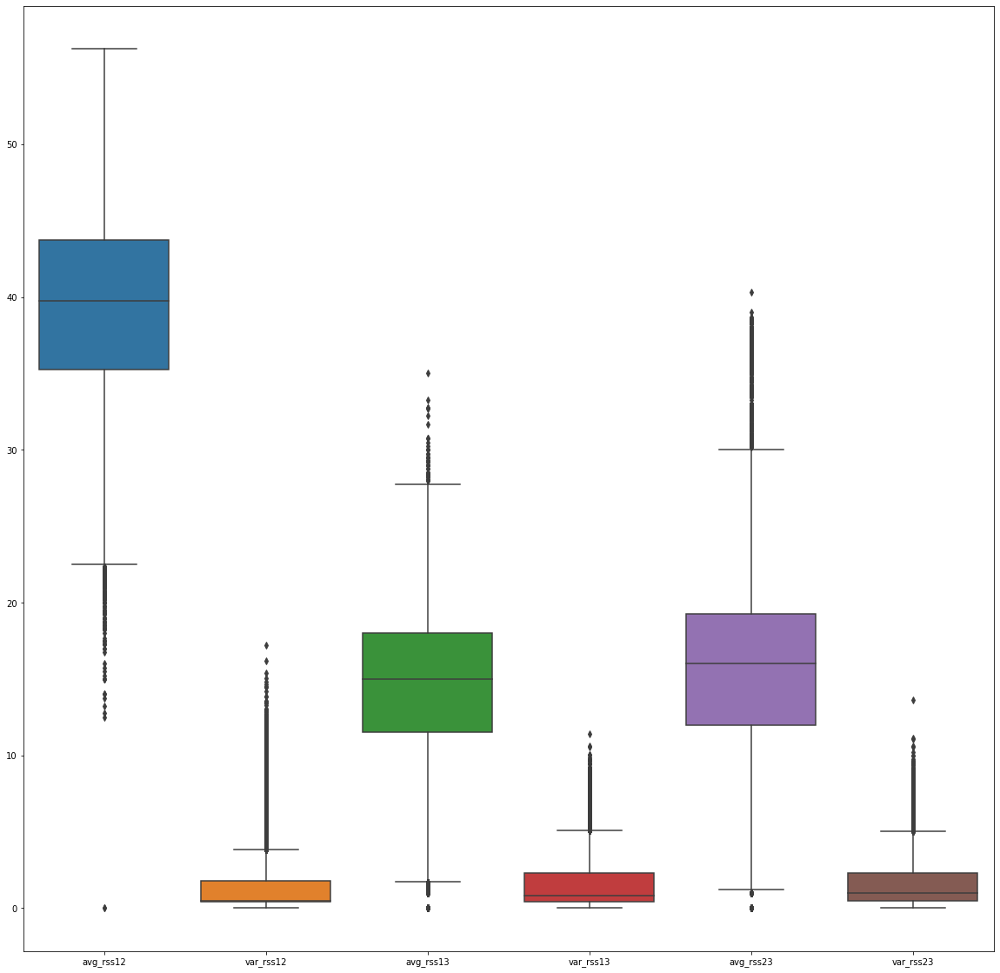

In [10]:
fig, ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = df, ax = ax)

In [11]:
df.columns

Index(['time', 'avg_rss12', 'var_rss12', 'avg_rss13', 'var_rss13', 'avg_rss23',
       'var_rss23', 'Activity'],
      dtype='object')

In [12]:
q = df['avg_rss12'].quantile(.99)
df_new = df[df['avg_rss12']<q]

q = df['var_rss12'].quantile(.99)
df_new = df[df['var_rss12']<q]

q = df['avg_rss13'].quantile(.99)
df_new = df[df['avg_rss13']<q]

q = df['var_rss13'].quantile(.99)
df_new = df[df['var_rss13']<q]

q = df['avg_rss23'].quantile(.99)
df_new = df[df['avg_rss23']<q]

q = df['var_rss23'].quantile(.99)
df_new = df[df['var_rss23']<q]



<AxesSubplot:>

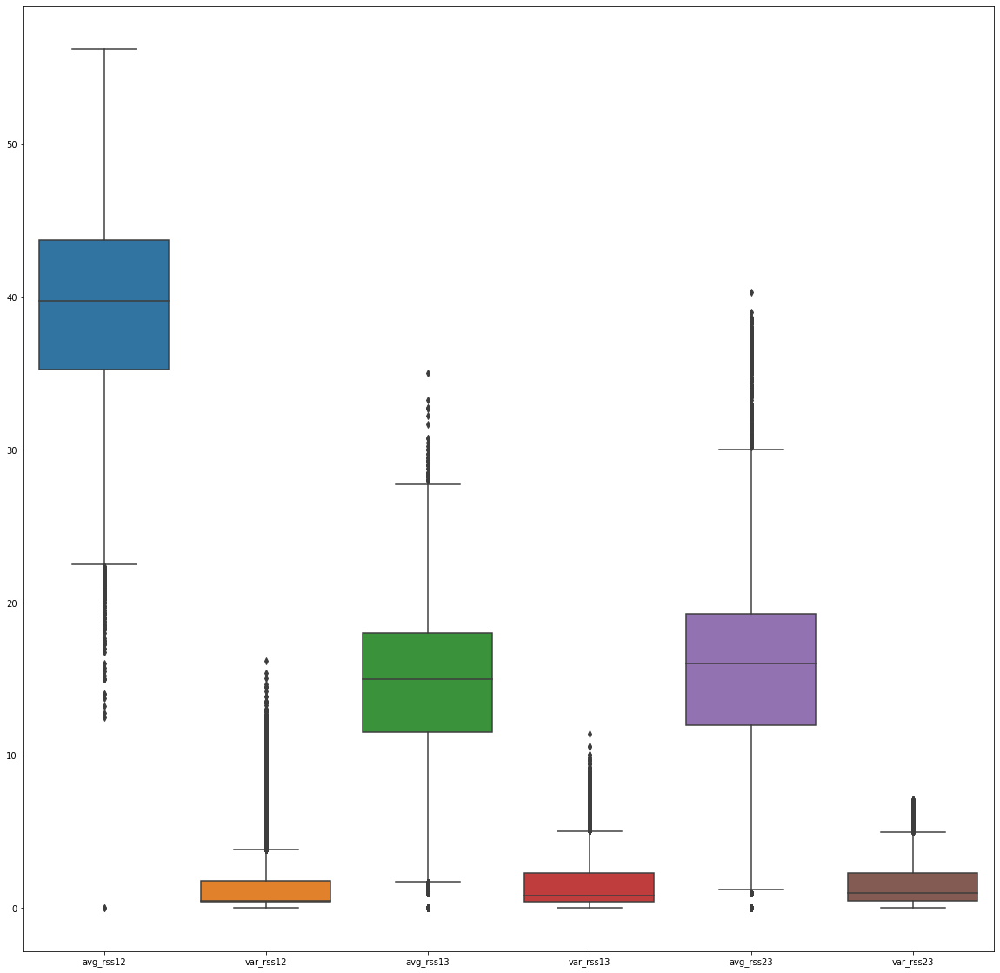

In [13]:
fig, ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = df_new, ax = ax)

In [14]:
q = df['avg_rss12'].quantile(.95)
df_new = df[df['avg_rss12']<q]

q = df['var_rss12'].quantile(.95)
df_new = df[df['var_rss12']<q]

q = df['avg_rss13'].quantile(.95)
df_new = df[df['avg_rss13']<q]

q = df['var_rss13'].quantile(.95)
df_new = df[df['var_rss13']<q]

q = df['avg_rss23'].quantile(.95)
df_new = df[df['avg_rss23']<q]

q = df['var_rss23'].quantile(.95)
df_new = df[df['var_rss23']<q]

<AxesSubplot:>

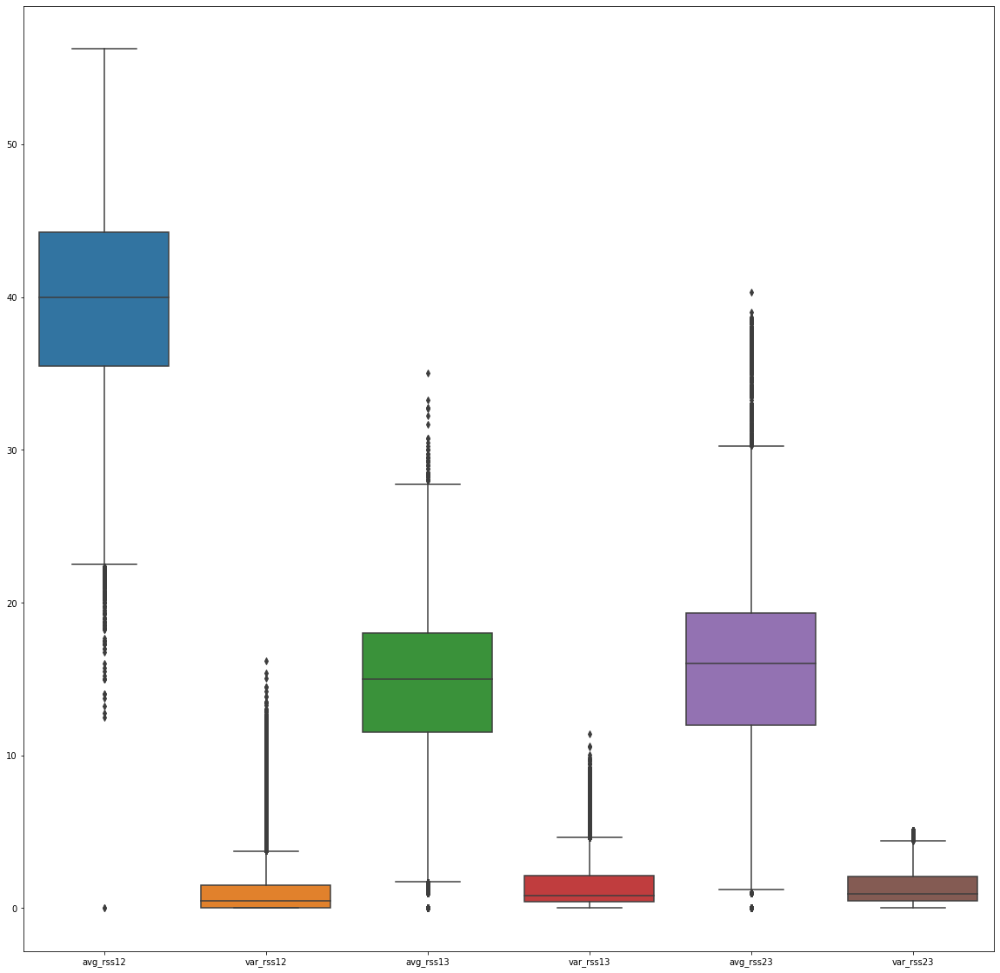

In [15]:
fig, ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = df_new, ax = ax)

In [16]:
q = df['avg_rss12'].quantile(.90)
df_new = df[df['avg_rss12']<q]

q = df['var_rss12'].quantile(.90)
df_new = df[df['var_rss12']<q]

q = df['avg_rss13'].quantile(.90)
df_new = df[df['avg_rss13']<q]

q = df['var_rss13'].quantile(.90)
df_new = df[df['var_rss13']<q]

q = df['avg_rss23'].quantile(.90)
df_new = df[df['avg_rss23']<q]

q = df['var_rss23'].quantile(.90)
df_new = df[df['var_rss23']<q]

<AxesSubplot:>

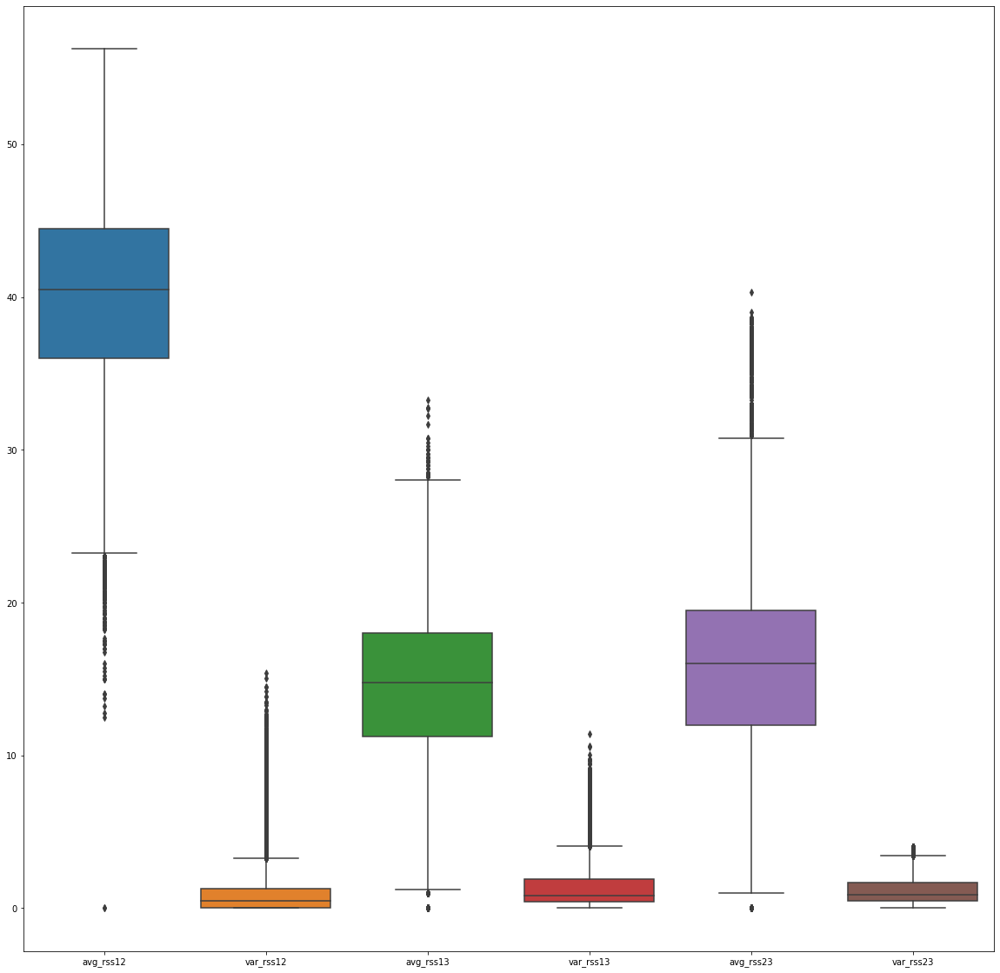

In [17]:
fig, ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = df_new, ax = ax)

In [18]:
q = df['avg_rss12'].quantile(.80)
df_new = df[df['avg_rss12']<q]

q = df['var_rss12'].quantile(.80)
df_new = df[df['var_rss12']<q]

q = df['avg_rss13'].quantile(.80)
df_new = df[df['avg_rss13']<q]

q = df['var_rss13'].quantile(.80)
df_new = df[df['var_rss13']<q]

q = df['avg_rss23'].quantile(.80)
df_new = df[df['avg_rss23']<q]

q = df['var_rss23'].quantile(.80)
df_new = df[df['var_rss23']<q]

<AxesSubplot:>

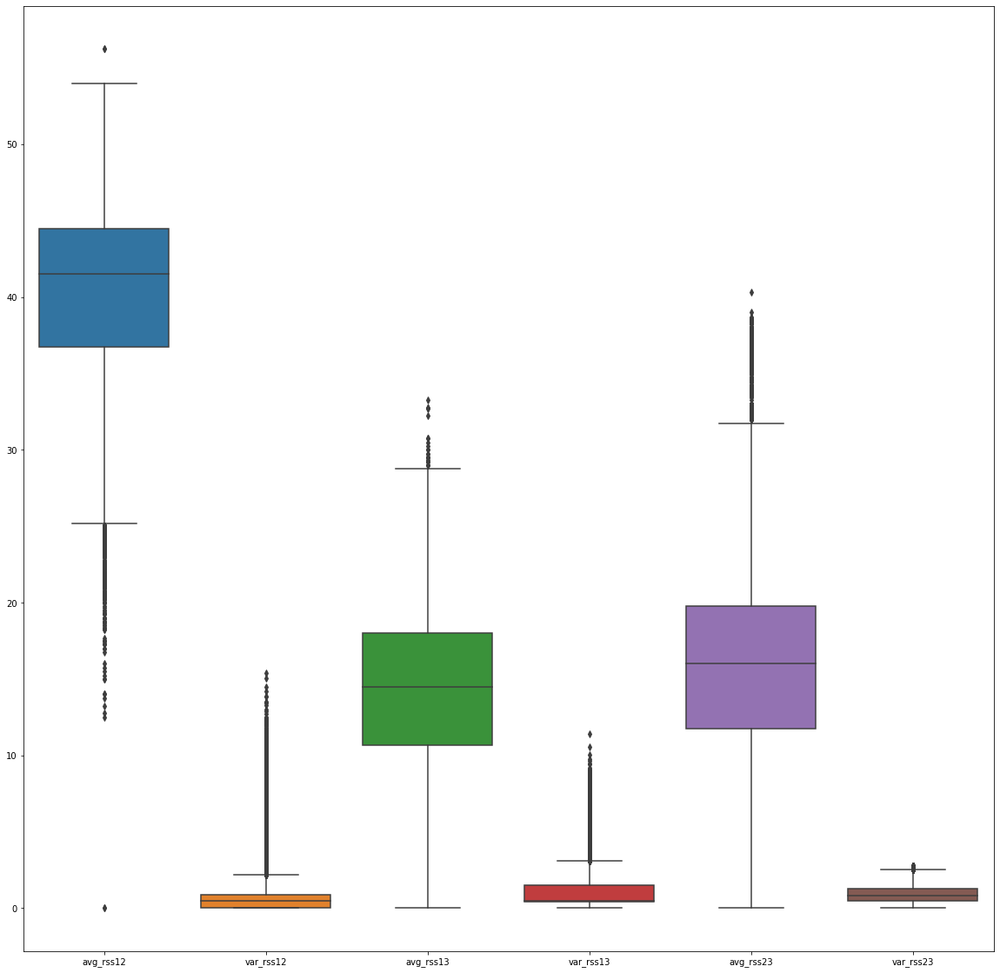

In [19]:
fig, ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = df_new, ax = ax)

In [20]:
q = df['avg_rss12'].quantile(.70)
df_new = df[df['avg_rss12']<q]

q = df['var_rss12'].quantile(.70)
df_new = df[df['var_rss12']<q]

q = df['avg_rss13'].quantile(.70)
df_new = df[df['avg_rss13']<q]

q = df['var_rss13'].quantile(.70)
df_new = df[df['var_rss13']<q]

q = df['avg_rss23'].quantile(.70)
df_new = df[df['avg_rss23']<q]

q = df['var_rss23'].quantile(.70)
df_new = df[df['var_rss23']<q]

<AxesSubplot:>

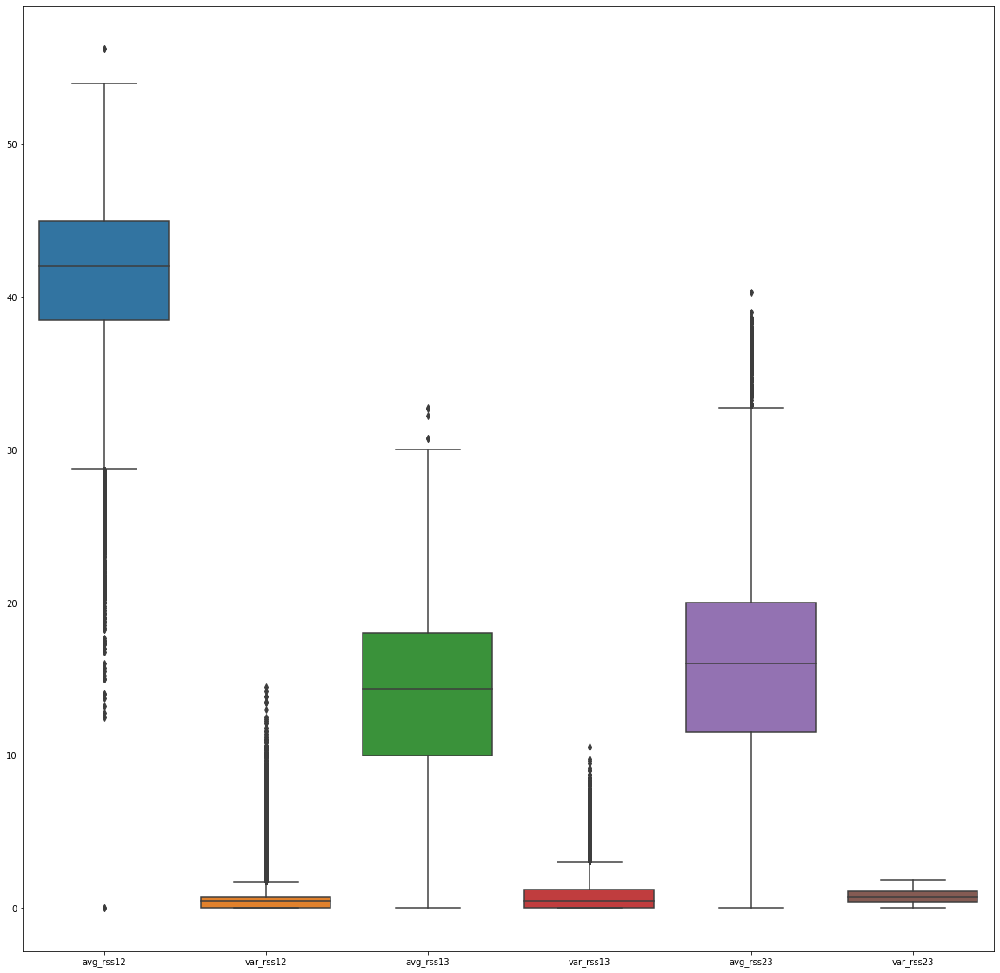

In [21]:
fig, ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = df_new, ax = ax)

In [22]:
# finally settling on quantile = 90%, because if I go to quantile = 80% or quantile = 70%, too much data is lost with very less effect

q = df['avg_rss12'].quantile(.90)
df_new = df[df['avg_rss12']<q]

q = df['var_rss12'].quantile(.90)
df_new = df[df['var_rss12']<q]

q = df['avg_rss13'].quantile(.90)
df_new = df[df['avg_rss13']<q]

q = df['var_rss13'].quantile(.90)
df_new = df[df['var_rss13']<q]

q = df['avg_rss23'].quantile(.90)
df_new = df[df['avg_rss23']<q]

q = df['var_rss23'].quantile(.90)
df_new = df[df['var_rss23']<q]

<AxesSubplot:>

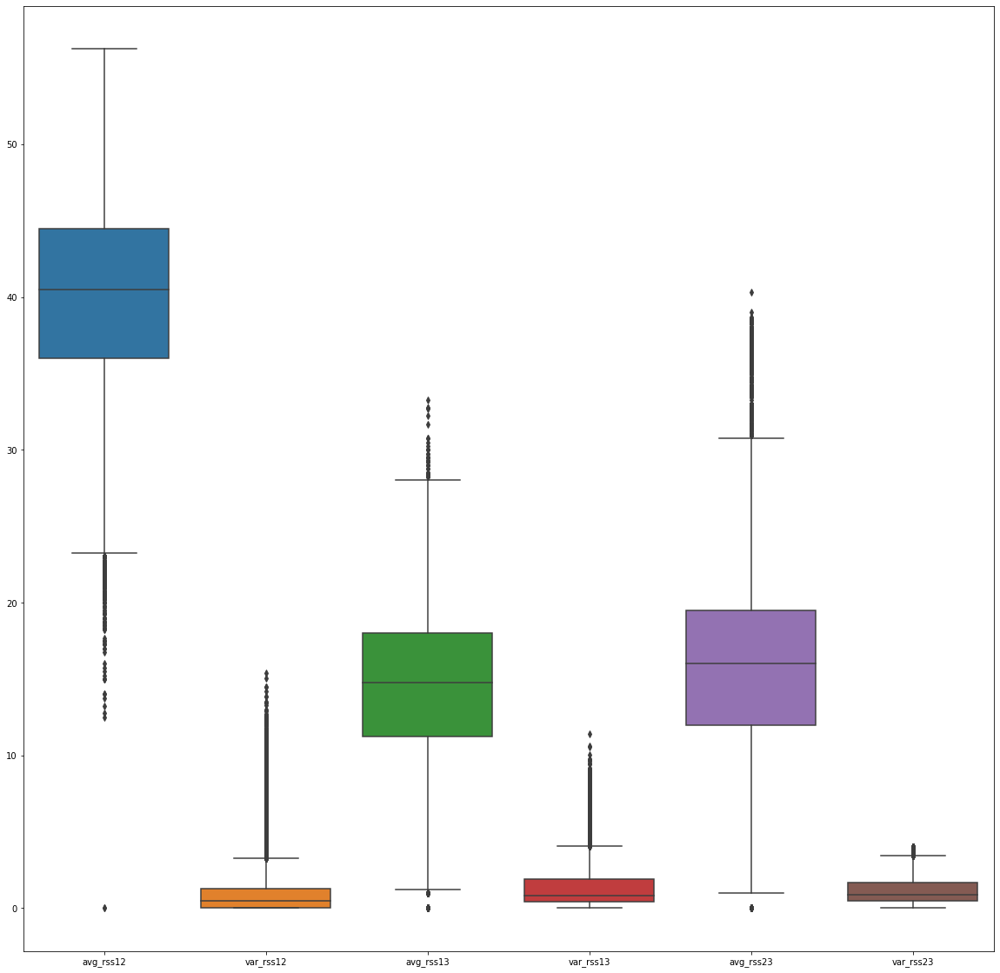

In [23]:
fig, ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = df_new, ax = ax)

In [24]:
ProfileReport(df_new)

In [25]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37935 entries, 0 to 42238
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   time       37935 non-null  object 
 1   avg_rss12  37935 non-null  float64
 2   var_rss12  37935 non-null  float64
 3   avg_rss13  37935 non-null  float64
 4   var_rss13  37935 non-null  float64
 5   avg_rss23  37935 non-null  float64
 6   var_rss23  37935 non-null  float64
 7   Activity   37935 non-null  object 
dtypes: float64(6), object(2)
memory usage: 2.6+ MB


In [26]:
df_new.drop(columns=['time'], inplace=True)   # time column doesn't seem to be useful so dropping it

C:\Users\hardi\anaconda3\lib\site-packages\pandas\core\frame.py:4167: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [27]:
y = df_new['Activity']

In [28]:
x = df_new.drop(columns=['Activity'])

In [29]:
x

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
0,39.25,0.43,22.75,0.43,33.75,1.30
1,39.25,0.43,23.00,0.00,33.00,0.00
2,39.25,0.43,23.25,0.43,33.00,0.00
3,39.50,0.50,23.00,0.71,33.00,0.00
4,39.50,0.50,24.00,0.00,33.00,0.00
...,...,...,...,...,...,...
42232,36.00,2.45,14.75,4.55,14.67,3.40
42235,27.33,1.25,11.33,0.94,20.00,4.00
42236,37.80,7.68,14.20,2.48,17.25,0.83
42237,33.75,1.30,15.75,5.21,16.50,2.69


In [30]:
y

0        bending1
1        bending1
2        bending1
3        bending1
4        bending1
           ...   
42232     walking
42235     walking
42236     walking
42237     walking
42238     walking
Name: Activity, Length: 37935, dtype: object

In [31]:
x_train , x_test , y_train , y_test = train_test_split(x ,  y  , test_size = .10 , random_state   =  0 )

In [32]:
LR = LogisticRegression(n_jobs=2)
LR1 = LogisticRegression(n_jobs=2, solver='liblinear')
LR2 = LogisticRegression(n_jobs=2, solver='newton-cg')
LR3 = LogisticRegression(n_jobs=2, solver='sag')

In [33]:
LR.fit(x_train, y_train)
LR1.fit(x_train, y_train)
LR2.fit(x_train, y_train)
LR3.fit(x_train, y_train)

C:\Users\hardi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
C:\Users\hardi\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


LogisticRegression(n_jobs=2, solver='sag')

In [34]:
y_pred  = LR.predict(x_test)
y_pred1  = LR1.predict(x_test)
y_pred2  = LR2.predict(x_test)
y_pred3  = LR3.predict(x_test)

In [35]:
confusion_matrix(y_test,y_pred)

array([[248,   7,   8,   1,  75,   0,   0],
       [ 65,  84,  76,   2,  37,   5,   0],
       [  3,  16, 324,   1,  35,   5, 144],
       [  4,   2,  17, 549,  65,  80,   2],
       [ 51,  44,  14,  85, 350, 171,   0],
       [  1,   1,   7,  66, 214, 433,   0],
       [  0,   6, 187,   0,   3,   1, 305]], dtype=int64)

In [36]:
AS = accuracy_score(y_test, y_pred)
AS1 = accuracy_score(y_test, y_pred1)
AS2 = accuracy_score(y_test, y_pred2)
AS3 = accuracy_score(y_test, y_pred3)

In [37]:
print(AS)
print(AS1)
print(AS2)
print(AS3)

0.6043753294675804
0.6394306800210859
0.658144438587243
0.6607801792303637


In [38]:
df

,time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Activity
0,0,39.25,0.43,22.75,0.43,33.75,1.30,bending1
1,250,39.25,0.43,23.00,0.00,33.00,0.00,bending1
2,500,39.25,0.43,23.25,0.43,33.00,0.00,bending1
3,750,39.50,0.50,23.00,0.71,33.00,0.00,bending1
4,1000,39.50,0.50,24.00,0.00,33.00,0.00,bending1
...,...,...,...,...,...,...,...,...
42234,118750,31.50,1.66,12.50,3.20,14.25,4.44,walking
42235,119000,27.33,1.25,11.33,0.94,20.00,4.00,walking
42236,119250,37.80,7.68,14.20,2.48,17.25,0.83,walking
42237,119500,33.75,1.30,15.75,5.21,16.50,2.69,walking


In [39]:
# Using sag model as its accuracy score is highest

LR3.predict([[39.25, 0.43, 22.75, 0.43, 33.75, 1.30]])  #Prediction for row 0 -- correct prediction

array(['bending1'], dtype=object)

In [40]:
LR3.predict([[33.75, 1.30, 15.75, 5.21, 16.50, 2.69]]) #Prediction for row 42237 -- wrong prediction

array(['cycling'], dtype=object)

In [41]:
LR3.predict([[32.67, 3.09, 18.67, 0.47, 14.00, 3.16]]) #Prediction for row 42238 -- correct prediction

array(['walking'], dtype=object)